In [ ]:
# Convolutional Neural Networks on CIFAR-10 Dataset #

In [ ]:
# Increasing the Cell Width of Jupyter Notebook

from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [ ]:
# Importing Libraries

import os
import torch
import tarfile
import requests
import torchvision
import numpy as np
import pandas as pd
import PIL.ImageOps
import seaborn as sns
from PIL import Image
import torch.nn as nn
from tqdm.auto import tqdm
import torch.nn.functional as F
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import random_split
from torchvision.transforms import ToTensor
from torchvision.datasets import ImageFolder
from sklearn.metrics import confusion_matrix
from torchvision.datasets.utils import download_url
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
# Dowloading the Dataset from an External Link

dataset_url = "https://s3.amazonaws.com/fast-ai-imageclas/cifar10.tgz"
download_url(dataset_url, '.')

100%|██████████| 135107811/135107811 [00:11<00:00, 11819630.89it/s]


In [ ]:
# Extracting Dataset from the Downloaded Archive File

with tarfile.open('./cifar10.tgz', 'r:gz') as tar:
    tar.extractall(path='./data')

In [ ]:
data_dir = './data/cifar10'
print(os.listdir(data_dir))

classes = os.listdir(data_dir + "/train")
print(classes)

['train', 'test']
['automobile', 'bird', 'dog', 'deer', 'ship', 'cat', 'airplane', 'truck', 'frog', 'horse']


In [ ]:
# Class Folder Example

airplane_files = os.listdir(data_dir + "/train/airplane")
print("Number of Training Examples for Airplanes:", len(airplane_files))
print("3 File Examples from the Airplane Folder :", airplane_files[:3])

Number of Training Examples for Airplanes: 5000
3 File Examples from the Airplane Folder : ['4584.png', '4842.png', '2543.png']


In [ ]:
ship_test_files = os.listdir(data_dir + "/test/ship")
print("Number of Testing Examples for Ships:", len(ship_test_files))
print("3 File Examples from the Ship Folder:", ship_test_files[:3])

Number of Testing Examples for Ships: 1000
3 File Examples from the Ship Folder: ['0362.png', '0588.png', '0449.png']


In [ ]:
# Defining Transformation for Datasets and Tensor Image Convertions

transform = transforms.Compose([transforms.Resize((32, 32)),
                                transforms.ToTensor()
                                ])

In [ ]:
# Loading the Full Dataset

dataset = ImageFolder(data_dir+'/train', transform=transform)

print(f"CIFAR-10 Images: {len(dataset)}")

CIFAR-10 Images: 50000


In [ ]:
# Image Shape, Label and Class Information for the First Data Sample: dataset[0]

image, label = dataset[0]
print(f"image.shape: {image.shape}")
print(f"label: {label}")
print(f"class: {dataset.classes[label]}")

image.shape: torch.Size([3, 32, 32])
label: 0
class: airplane


In [ ]:
# Defining a Useful Image Plotter Function

def plot_image(img, lbl):
    plt.axis('off')
    plt.title(f"({dataset.classes[lbl]})")
    plt.imshow(img.permute(1, 2, 0))

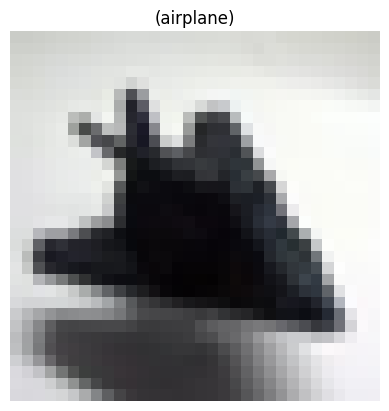

In [ ]:
# Plotting a Tensor Image from the Dataset with (*) Sign to Send the dataset[0] Tuple: (image, label)

plot_image(*dataset[0])

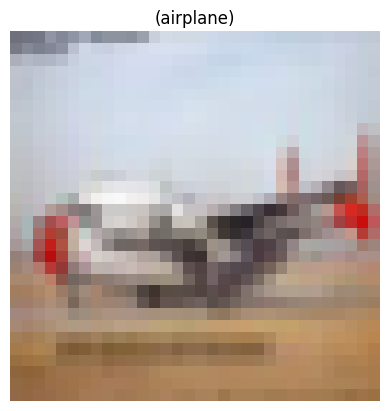

In [ ]:
# Plotting a Tensor Image from the Dataset Without (*) Sign

plot_image(dataset[1099][0], dataset[1099][1])

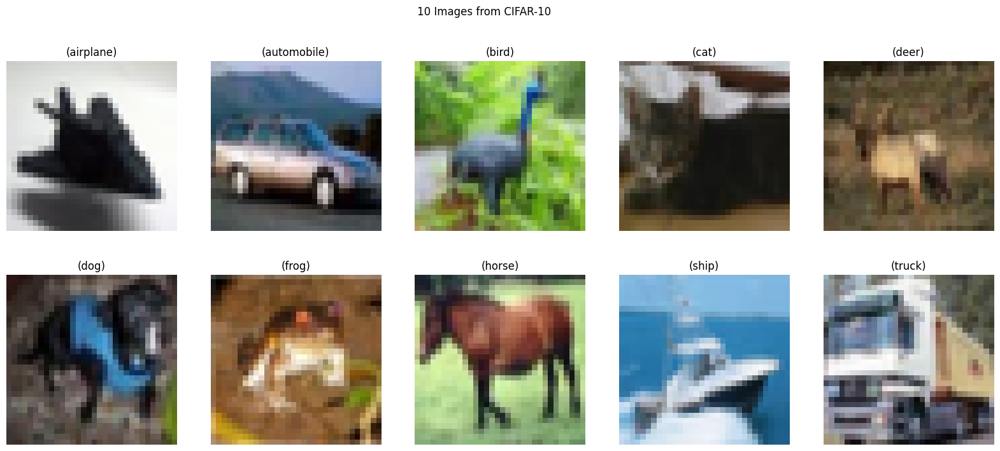

In [ ]:
# Plotting Multiple Images from the Dataset

cols = 5
rows = 2

fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(cols * 4, rows * 4))

for i, ax in enumerate(axs.flatten()):
    ind = 5000 * i
    plt.sca(ax)
    #image, label = dataset[ind]
    #plt_image(image, label)
    plot_image(*dataset[ind])

plt.suptitle(f"{rows * cols} Images from CIFAR-10")
plt.show()

In [ ]:
# Seed Number is Set to a Number (42) in Order to Make Sure that the Next Runs of the Code will Reproduce the Same Results.

random_seed = 42
torch.manual_seed(random_seed);

In [ ]:
# Allocating the Training, Validation and Testing Sets from the CIFAR-10 Dataset with the Given Transformations

transform = transforms.Compose([transforms.Resize((32, 32)),
                                transforms.ToTensor()
                                ])

dataset = ImageFolder(data_dir+'/train', transform=transform)

valid_size = 5000
train_size = len(dataset) - valid_size

train_ds, valid_ds = random_split(dataset, [train_size, valid_size])
test_ds = ImageFolder(data_dir+'/test', transform=transform)


print("Train Valid Test")
print(len(train_ds), len(valid_ds), len(test_ds))

Train Valid Test
45000 5000 10000


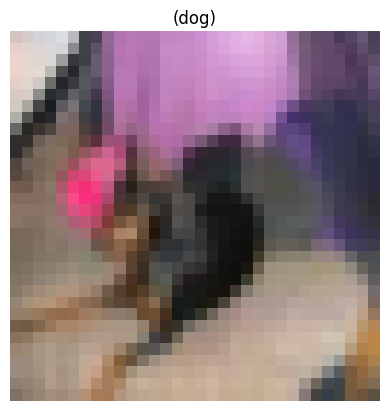

In [ ]:
# Plotting a Tensor Image from the Splitted Training Set

image, label = train_ds[100]
plot_image(image, label)

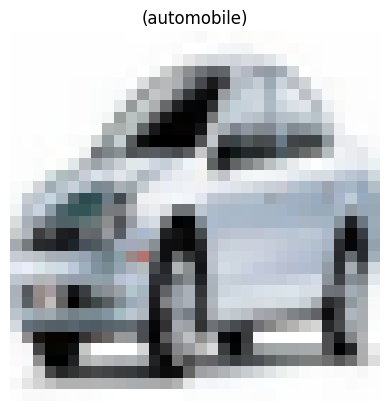

In [ ]:
# Plotting a Tensor Image from the Splitted Validation Set

image, label = valid_ds[540]
plot_image(image, label)

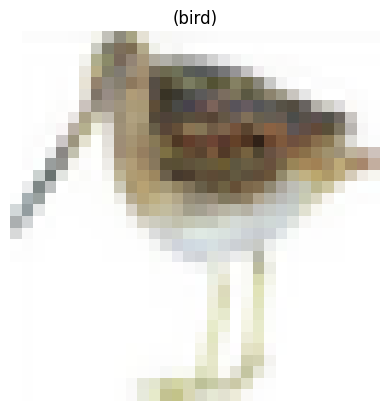

In [ ]:
# Plotting a Tensor Image from the Splitted Validation Set

image, label = test_ds[2955]
plot_image(image, label)

In [ ]:
# Defining Data Loaders and Batch Size

from torch.utils.data.dataloader import DataLoader

batch_size=128

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2, pin_memory=True)
valid_dl = DataLoader(valid_ds, batch_size*2, num_workers=2, pin_memory=True)
test_dl  = DataLoader(test_ds, 1000, num_workers=2, pin_memory=True)

In [ ]:
# Function to Plot A Grid from One Batch of Images

def plot_batch(dl, x_size=16, y_size=8):
    for images, labels in dl:
        fig, ax = plt.subplots(figsize=(x_size, y_size))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(images, nrow=x_size).permute(1, 2, 0))
        break

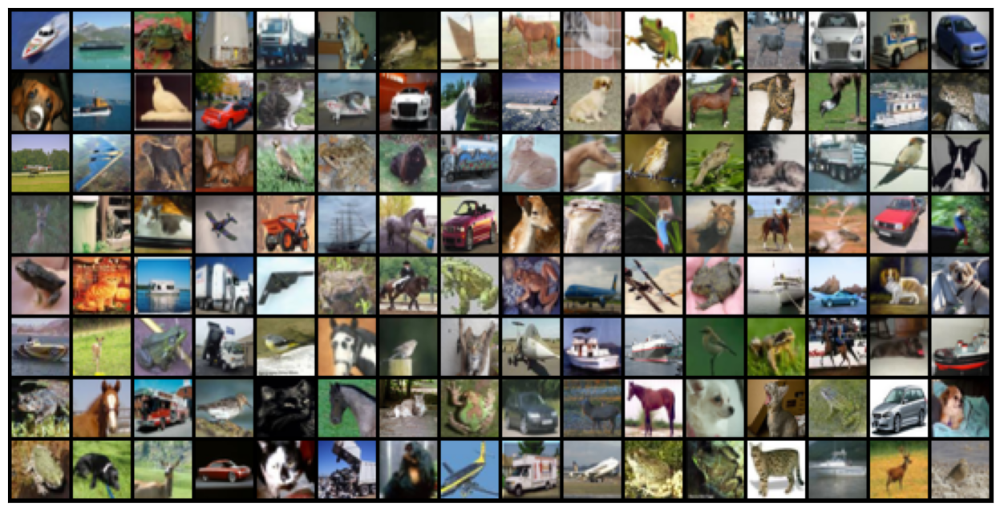

In [ ]:
# This Grid from the First Batch of the "train_dl" Contains a Mixture of Images from Different Classes Since the Training and Validation Datasets were Randomly Splitted

plot_batch(train_dl)

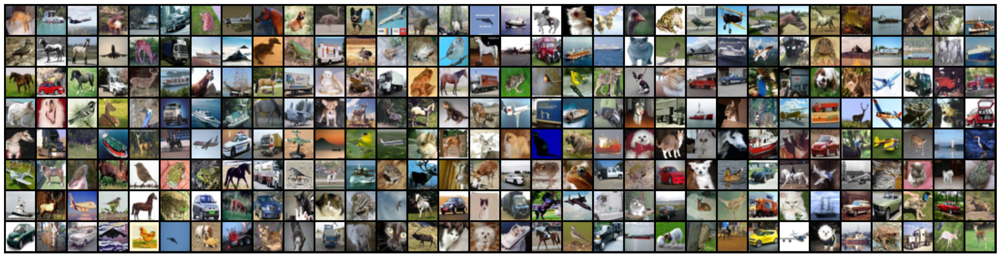

In [ ]:
# This Grid from the First Batch of the "valid_dl" Contains a Mixture of Images from Different Classes Since the Training and Validation Datasets were Randomly Splitted

plot_batch(valid_dl, 32, 8)

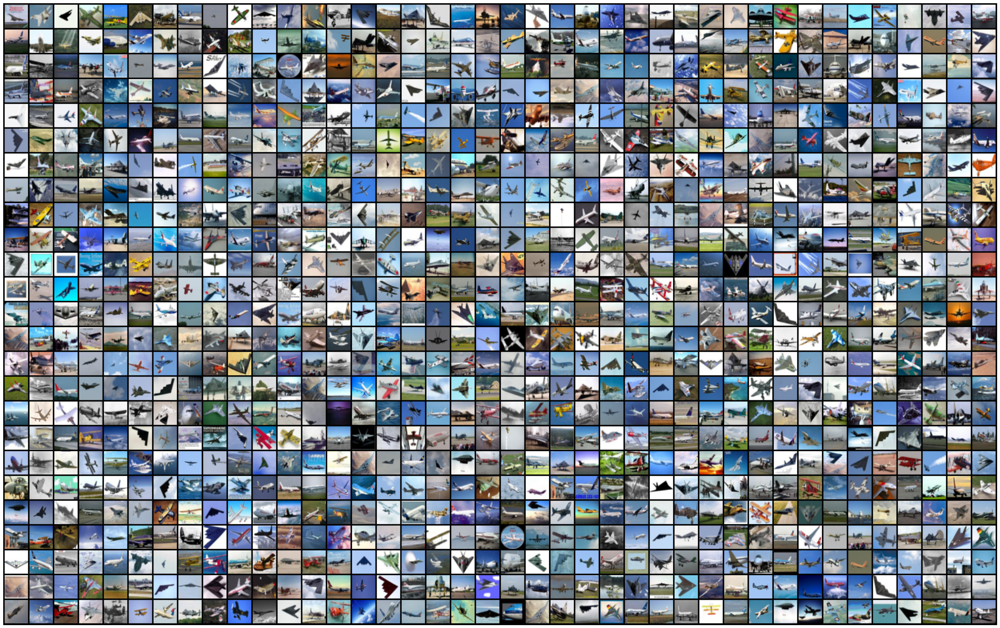

In [ ]:
# This Grid from the First Batch (1000) of the "test_dl" Contains Images Only from the Same Class of 1000 Images Since the Testing Dataset was Not Randomly Splited

plot_batch(test_dl, 40, 25)

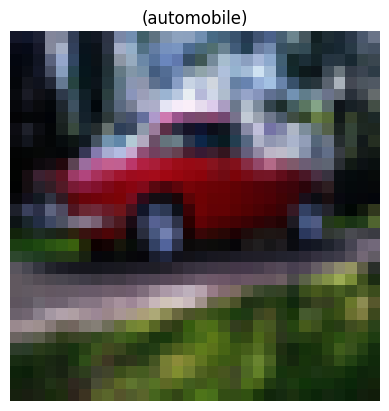

In [ ]:
# Plotting Tensor Images from a Batch of the Training Data Loader by Using plot_image() Function

dataiter = iter(train_dl)
images, labels = next(dataiter)

ind = 45
plot_image(images[ind], labels[ind])

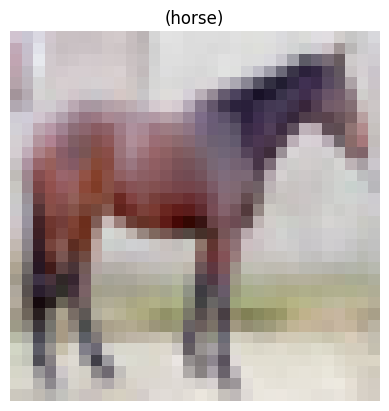

In [ ]:
# Plotting Tensor Images from a Batch of the Validation Data Loader by Directly Using permute(1, 2, 0)

dataiter = iter(valid_dl)
images, labels = next(dataiter)

ind = 78
plt.axis('off')
plt.title(f"({dataset.classes[labels[ind]]})")
plt.imshow(images[ind].permute(1, 2, 0));

In [ ]:
# The Functionality of permute(1, 2, 0)

image, _ = dataset[0]
print(image.shape)
print(image.permute(1, 2, 0).shape)

torch.Size([3, 32, 32])
torch.Size([32, 32, 3])


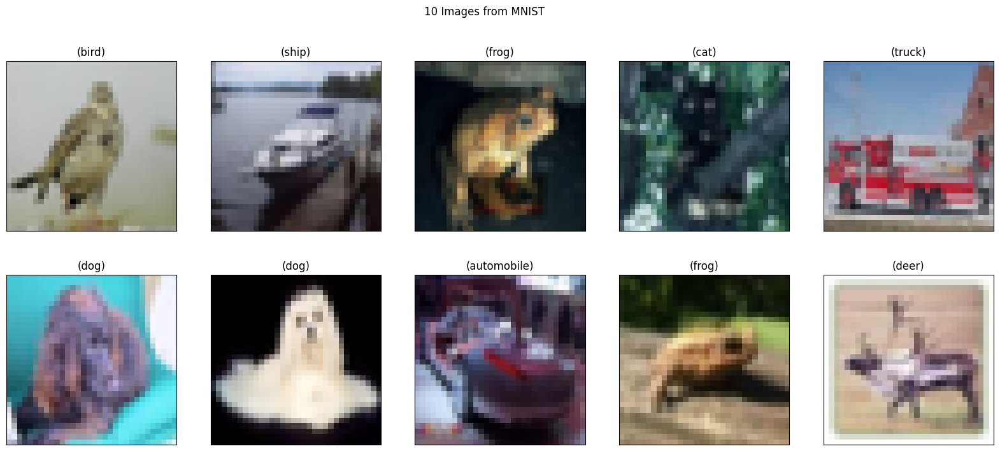

In [ ]:
# Plotting A Bunch of Tensor Images from the Same One Batch

dataiter = iter(train_dl)
images, labels = next(dataiter)

cols = 5
rows = 2

fig = plt.figure(figsize=(cols * 4, rows * 4))

for idx in np.arange(rows * cols):
    ax = fig.add_subplot(rows, cols, idx+1, xticks=[], yticks=[])
    #plot_image(images[idx], labels[idx])               # If you Use This, Comment out the Next Two Lines Marked with (---)
    plt.imshow(images[idx].permute(1, 2, 0))            # ---
    ax.set_title(f"({dataset.classes[labels[idx]]})")   # ---

plt.suptitle(f"{rows * cols} Images from MNIST")
plt.show()

In [ ]:
#######################################
### Defining Functions for CIFAR-10 ###
#######################################

In [ ]:
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in tqdm(val_loader, desc=f"Evaluation")]
    return model.validation_epoch_end(outputs)


def fit(epochs, lr, model, train_loader, val_loader, opt_func=torch.optim.SGD):
    history = []
    optimizer = opt_func(model.parameters(), lr)
    for epoch in range(epochs):
        # Training Phase
        model.train()
        train_losses = []
        for batch in tqdm(train_loader, desc=f"Epoch [{epoch+1}/{epochs}]"):
            optimizer.zero_grad()
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()
            optimizer.step()
        # Validation phase
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        model.epoch_end(epoch, epochs, result)
        history.append(result)
    return history

In [ ]:
class ImageClassificationBase(nn.Module):
    def training_step(self, batch):
        images, labels = batch
        out = self(images)                    # Generate Predictions
        loss = F.cross_entropy(out, labels)   # Evaluate Loss
        return loss

    def validation_step(self, batch):
        images, labels = batch
        out = self(images)                    # Generate Predictions
        loss = F.cross_entropy(out, labels)   # Evaluate Loss
        acc = accuracy(out, labels)           # Evaluate Accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}

    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine Losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine Accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}

    def epoch_end(self, epoch, epochs, result):
        print("Epoch [{}/{}], train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch+1, epochs, result['train_loss'], result['val_loss'], result['val_acc']))


def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

In [ ]:
# Convolutional Neural Network

class Cifar10CnnModel(ImageClassificationBase):
    def __init__(self):
        super().__init__()
        self.network = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),   # in:  3 x 32 x 32
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),     # out: 64 x 16 x 16

            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),     # out: 128 x 8 x 8

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),     # out: 256 x 4 x 4

            nn.Flatten(),
            nn.Linear(256*4*4, 1024),
            nn.ReLU(),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Linear(512, 10))

    def forward(self, xb):
        return self.network(xb)

In [ ]:
# Creating the Model

model = Cifar10CnnModel()
print(model)

Cifar10CnnModel(
  (network): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU()
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU()
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU()
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU()
    (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (15): Flatten(start_dim=1, end_dim=-1)
    (16): Linear(in_features=4096, out_features=1024, bias=True)
    (17): ReLU()
    (18): Linear(in_feat

In [ ]:
# Definition of Device Loader Functions to Send Data Loaders to the Current Device (GPU) Before Training

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list, tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)


class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""

    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
# Sending All the Data Loaders and the Model to the Current Device

train_dl = DeviceDataLoader(train_dl, device)
valid_dl = DeviceDataLoader(valid_dl, device)
test_dl = DeviceDataLoader(test_dl, device)
model = to_device(model, device)

print(f"train_dl.device: {train_dl.device}")
print(f"valid_dl.device: {valid_dl.device}")
print(f"valid_dl.device: {test_dl.device}")
if next(model.parameters()).is_cuda:
    print(f"model.device   : cuda")
else:
    print(f"model.device   : cpu")

train_dl.device: cuda
valid_dl.device: cuda
valid_dl.device: cuda
model.device   : cuda


In [ ]:
evaluate(model, valid_dl)

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

{'val_loss': 2.3031628131866455, 'val_acc': 0.09630055725574493}

In [ ]:
epochs = 20
lr = 0.001
opt_func = torch.optim.Adam
history = fit(epochs, lr, model, train_dl, valid_dl, opt_func)

Epoch [1/20]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [1/20], train_loss: 1.7641, val_loss: 1.4690, val_acc: 0.4601


Epoch [2/20]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [2/20], train_loss: 1.2350, val_loss: 1.1070, val_acc: 0.5954


Epoch [3/20]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [3/20], train_loss: 0.9697, val_loss: 0.9255, val_acc: 0.6769


Epoch [4/20]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [4/20], train_loss: 0.7938, val_loss: 0.8135, val_acc: 0.7147


Epoch [5/20]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [5/20], train_loss: 0.6645, val_loss: 0.7805, val_acc: 0.7367


Epoch [6/20]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [6/20], train_loss: 0.5464, val_loss: 0.8199, val_acc: 0.7355


Epoch [7/20]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [7/20], train_loss: 0.4444, val_loss: 0.7369, val_acc: 0.7612


Epoch [8/20]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [8/20], train_loss: 0.3627, val_loss: 0.7880, val_acc: 0.7614


Epoch [9/20]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [9/20], train_loss: 0.2686, val_loss: 0.8425, val_acc: 0.7656


Epoch [10/20]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [10/20], train_loss: 0.2083, val_loss: 0.9127, val_acc: 0.7555


Epoch [11/20]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [11/20], train_loss: 0.1701, val_loss: 1.0758, val_acc: 0.7580


Epoch [12/20]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [12/20], train_loss: 0.1312, val_loss: 1.2236, val_acc: 0.7504


Epoch [13/20]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [13/20], train_loss: 0.1102, val_loss: 1.1955, val_acc: 0.7582


Epoch [14/20]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [14/20], train_loss: 0.1004, val_loss: 1.3693, val_acc: 0.7423


Epoch [15/20]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [15/20], train_loss: 0.0848, val_loss: 1.4716, val_acc: 0.7500


Epoch [16/20]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [16/20], train_loss: 0.0891, val_loss: 1.2981, val_acc: 0.7666


Epoch [17/20]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [17/20], train_loss: 0.0790, val_loss: 1.2979, val_acc: 0.7685


Epoch [18/20]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [18/20], train_loss: 0.0619, val_loss: 1.4393, val_acc: 0.7575


Epoch [19/20]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [19/20], train_loss: 0.0708, val_loss: 1.3870, val_acc: 0.7608


Epoch [20/20]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [20/20], train_loss: 0.0731, val_loss: 1.3607, val_acc: 0.7523


In [ ]:
epochs = 10
lr = 0.0005
opt_func = torch.optim.Adam
history += fit(epochs, lr, model, train_dl, valid_dl, opt_func)

Epoch [1/10]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [1/10], train_loss: 0.0282, val_loss: 1.7010, val_acc: 0.7708


Epoch [2/10]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [2/10], train_loss: 0.0183, val_loss: 1.9158, val_acc: 0.7686


Epoch [3/10]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [3/10], train_loss: 0.0189, val_loss: 1.9165, val_acc: 0.7607


Epoch [4/10]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [4/10], train_loss: 0.0206, val_loss: 1.8243, val_acc: 0.7718


Epoch [5/10]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [5/10], train_loss: 0.0118, val_loss: 1.9387, val_acc: 0.7710


Epoch [6/10]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [6/10], train_loss: 0.0207, val_loss: 1.9386, val_acc: 0.7727


Epoch [7/10]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [7/10], train_loss: 0.0111, val_loss: 1.9322, val_acc: 0.7712


Epoch [8/10]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [8/10], train_loss: 0.0187, val_loss: 2.1449, val_acc: 0.7547


Epoch [9/10]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [9/10], train_loss: 0.0222, val_loss: 1.9678, val_acc: 0.7763


Epoch [10/10]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [10/10], train_loss: 0.0164, val_loss: 1.9536, val_acc: 0.7687


In [ ]:
epochs = 10
lr = 0.0001
opt_func = torch.optim.Adam
history += fit(epochs, lr, model, train_dl, valid_dl, opt_func)

Epoch [1/10]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [1/10], train_loss: 0.0033, val_loss: 2.0935, val_acc: 0.7826


Epoch [2/10]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [2/10], train_loss: 0.0002, val_loss: 2.1409, val_acc: 0.7828


Epoch [3/10]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [3/10], train_loss: 0.0001, val_loss: 2.1914, val_acc: 0.7853


Epoch [4/10]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [4/10], train_loss: 0.0000, val_loss: 2.2409, val_acc: 0.7865


Epoch [5/10]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [5/10], train_loss: 0.0000, val_loss: 2.3638, val_acc: 0.7853


Epoch [6/10]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [6/10], train_loss: 0.0000, val_loss: 2.5984, val_acc: 0.7861


Epoch [7/10]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [7/10], train_loss: 0.0000, val_loss: 2.7701, val_acc: 0.7857


Epoch [8/10]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [8/10], train_loss: 0.0000, val_loss: 2.8947, val_acc: 0.7855


Epoch [9/10]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [9/10], train_loss: 0.0000, val_loss: 2.9975, val_acc: 0.7857


Epoch [10/10]:   0%|          | 0/352 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [10/10], train_loss: 0.0000, val_loss: 3.1010, val_acc: 0.7859


In [ ]:
def plot_accuracies(history):
    accuracies = [x['val_acc'] for x in history]
    plt.plot(accuracies, '-o')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.title('Accuracy vs. No. of epochs');


def plot_losses(history):
    train_losses = [x.get('train_loss') for x in history]
    val_losses = [x['val_loss'] for x in history]
    plt.plot(train_losses, '-bo')
    plt.plot(val_losses, '-ro')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs');

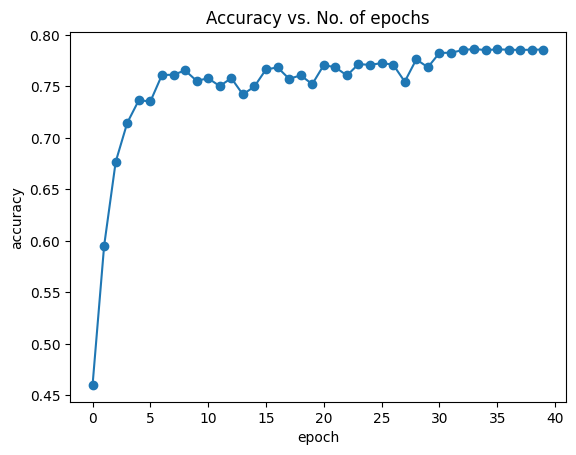

In [ ]:
plot_accuracies(history)

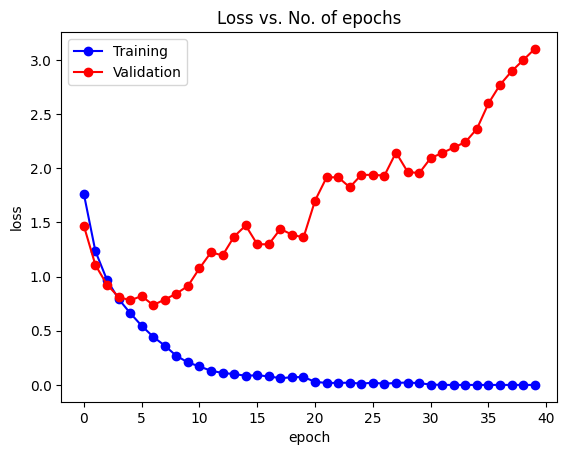

In [ ]:
plot_losses(history)

In [ ]:
# Overfitting Detected!

In [ ]:
def predict_image(img, model):
    # Convert img to 1 Batch of Tensor Image
    images = img.unsqueeze(0)
    # Get Predictions from the Model
    outputs = model(images)
    # Pick Index with the Highest Probability
    _, pred  = torch.max(outputs, dim=1)
    # Return the Class Index
    return pred.item()

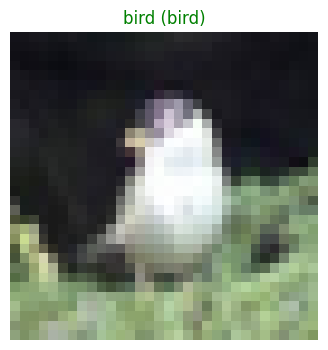

In [ ]:
# Plotting an Image with Its Label Prediction by Using the predict_image() Function

image, label = test_ds[2040]
image = image.to(device)
plt.figure(figsize=(4, 4))
plt.axis('off')
label = dataset.classes[label]
pred = dataset.classes[predict_image(image, model)]
plt.title(f"{pred} ({label})", color=("green" if pred==label else "red"))
plt.imshow(image.cpu().permute(1, 2, 0));

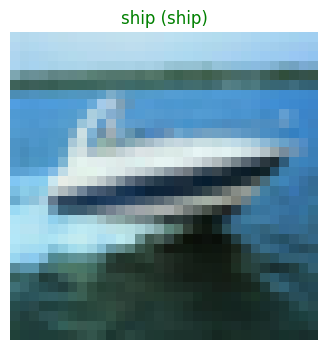

In [ ]:
# Plotting an Image with Its Label Prediction by NOT Using the predict_image() Function

image, label = test_ds[8920]
image = image.to(device)
output = model(image.unsqueeze(0))
_, pred = torch.max(output, 1)
pred = dataset.classes[pred]
label = dataset.classes[label]
plt.figure(figsize=(4, 4)); plt.axis('off')
plt.title(f"{pred} ({label})", color=("green" if pred==label else "red"))
plt.imshow(image.cpu().permute(1, 2, 0));

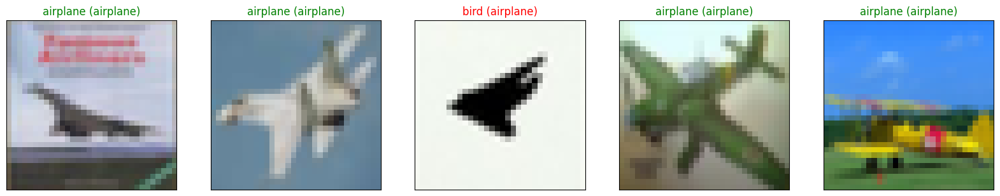

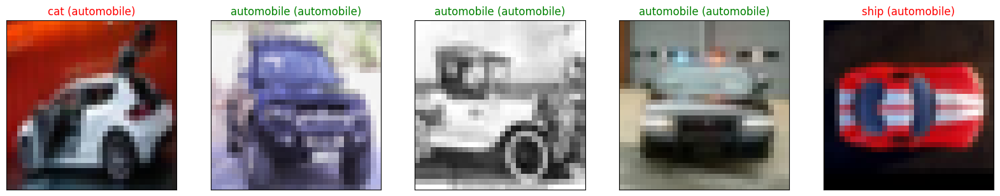

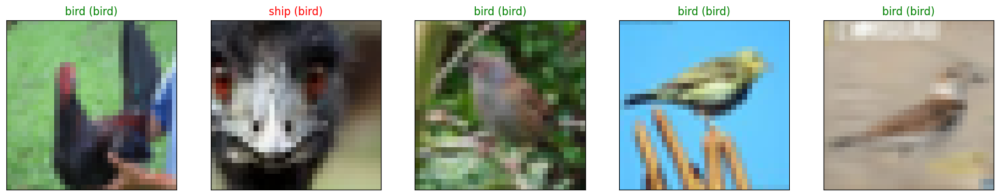

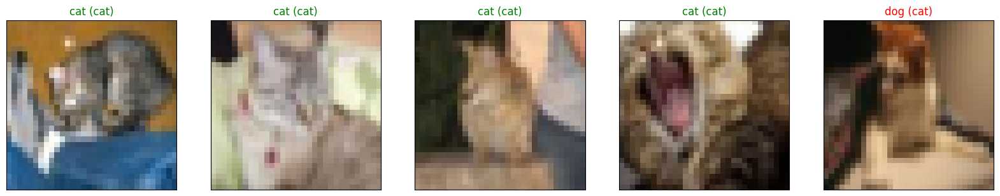

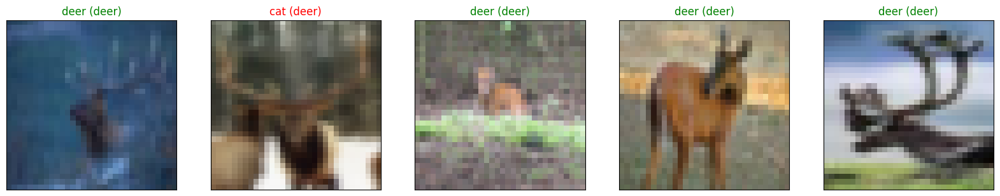

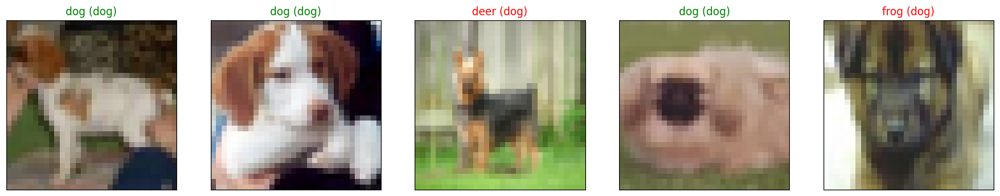

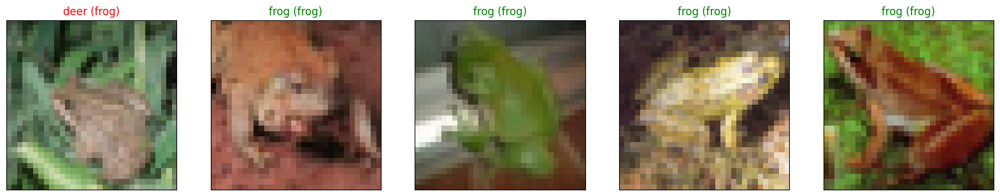

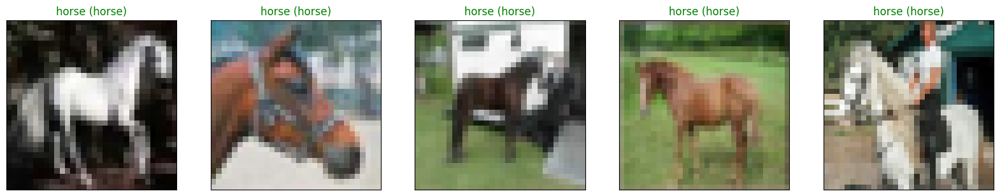

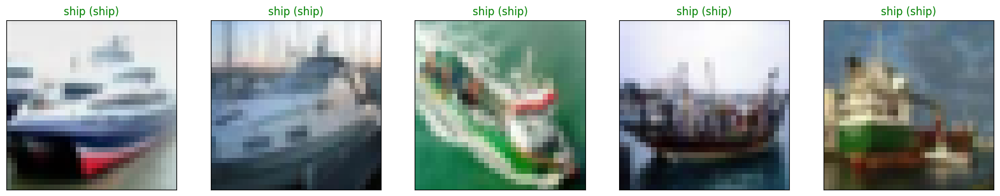

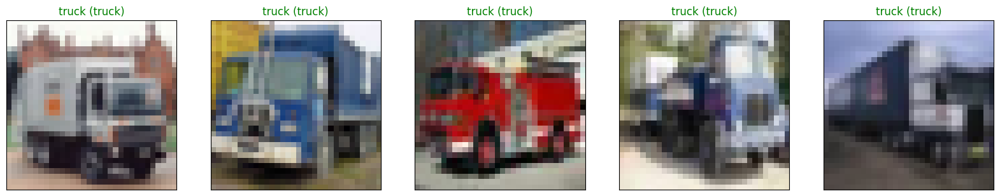

In [ ]:
# Getting Images & Labels from One Batch
#dataiter = iter(valid_loader)
#images, labels = next(dataiter)

i = 0
# Getting Images & Labels from Different Batches
for images, labels in test_dl:

    outputs = model(images)
    _, preds = torch.max(outputs, 1)

    col = 5
    row = 1     # Get 1 Row from Each Batch

    fig = plt.figure(figsize=(col * 4, row * 4))

    for idx in np.arange(row * col):
        ax = fig.add_subplot(row, col, idx+1, xticks=[], yticks=[])
        plt.imshow(images[idx].cpu().permute(1, 2, 0));
        pred = dataset.classes[preds[idx].item()]
        label = dataset.classes[labels[idx].item()]
        ax.set_title("{} ({})".format(str(pred), str(label)), color=("green" if pred==label else "red"))

    i += 1
    if i == 10:
        break   # Get 1 Row From 10 Different Batches (Since the Batch Size is 1000, Labels of 5 Images from All the 10 Classes will Be Predicted)

Making Predictions:   0%|          | 0/10 [00:00<?, ?it/s]

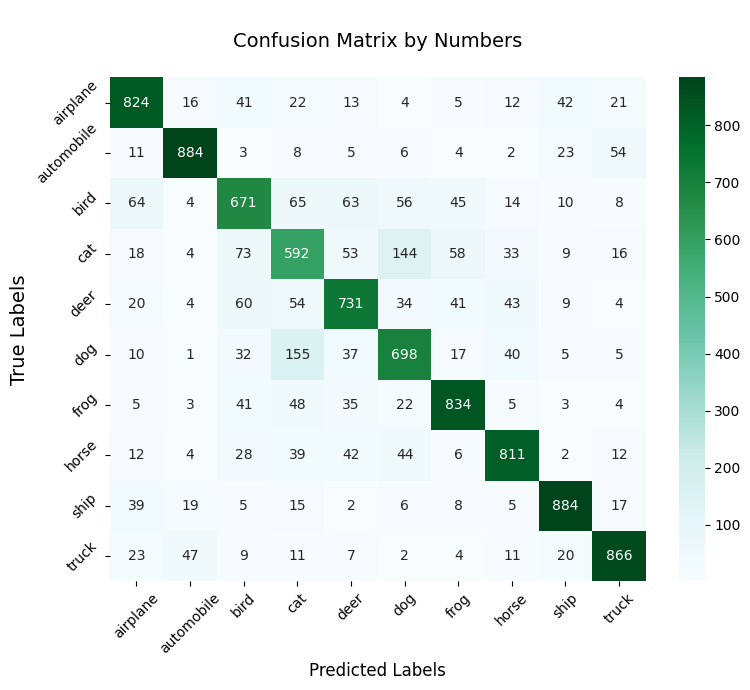

In [ ]:
# Confusion Matrix by Numbers

y_pred = []
y_true = []

model.eval()
with torch.no_grad():
    for inputs, labels in tqdm(test_dl, desc="Making Predictions"):
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        y_pred.extend(preds.cpu().numpy())
        y_true.extend(labels.cpu().numpy())

# Calculating Confusion Matrix
cf_matrix = confusion_matrix(y_true, y_pred)

class_names = []
for i in range(10):
    class_names.append(dataset.classes[i])

df_cm = pd.DataFrame(cf_matrix, class_names, class_names)

plt.figure(figsize=(8, 7))
sns.heatmap(df_cm, annot=True, cmap="BuGn", fmt='g')
plt.title("\nConfusion Matrix by Numbers\n", fontsize=14)
plt.ylabel("True Labels", fontsize=14)
plt.xlabel("Predicted Labels", fontsize=12)
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()

Making Predictions:   0%|          | 0/10 [00:00<?, ?it/s]

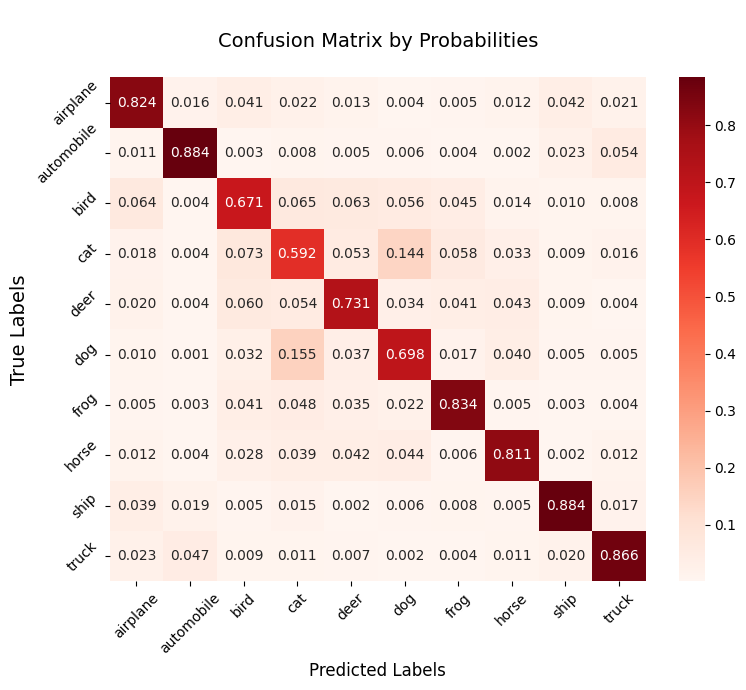

In [ ]:
# Confusion Matrix by Probabilities

y_pred = []
y_true = []

model.eval()
with torch.no_grad():
    for inputs, labels in tqdm(test_dl, desc="Making Predictions"):
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        y_pred.extend(preds.cpu().numpy())
        y_true.extend(labels.cpu().numpy())

# Calculating Confusion Matrix
cf_matrix = confusion_matrix(y_true, y_pred)

class_names = []
for i in range(10):
    class_names.append(dataset.classes[i])

df_cm = pd.DataFrame(cf_matrix / np.sum(cf_matrix, axis=1)[:, None], class_names, class_names)

plt.figure(figsize=(8, 7))
sns.heatmap(df_cm, annot=True, cmap='Reds', fmt=".3f")
plt.title("\nConfusion Matrix by Probabilities\n", fontsize=14)
plt.ylabel("True Labels", fontsize=14)
plt.xlabel("Predicted Labels", fontsize=12)
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
result = evaluate(model, test_dl)
print(result)

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

{'val_loss': 3.056288957595825, 'val_acc': 0.7794999480247498}


In [ ]:
# Using the Trained Model for Batch Loading from test_loader

model.eval()
with torch.no_grad():
    for images, labels in test_dl:  # test_loader is Already in Device
        outputs = model(images)
        break

print(f"Sample Outputs:\n{outputs[:1].data}")

Sample Outputs:
tensor([[ 13.9556, -13.4711,  -2.5679, -14.5967, -11.7193, -35.6608, -25.8526,
         -28.5116,   5.6156, -22.5802]], device='cuda:0')


In [ ]:
# Applying Softmax() Function for Each Output Row
probs = nn.Softmax(dim=1)(outputs)
#probs = F.softmax(outputs, dim=1)

# Looking at Sample Probabilities
print("Sample Probabilities:\n", probs[:1].data)

# Adding up the Probabilities of an Output Row
print("\nSum of probs[0]:", torch.sum(probs[:1]).item())

Sample Probabilities:
 tensor([[9.9976e-01, 1.2263e-12, 6.6651e-08, 3.9788e-13, 7.0702e-12, 2.8299e-22,
         5.1454e-18, 3.6027e-19, 2.3871e-04, 1.3570e-16]], device='cuda:0')

Sum of probs[0]: 0.9999999403953552


In [ ]:
# Analysis of Truth Labels & Predicted Labels (Since the Batch Size of test_dl is 1000, Printing is Limited to batch_size of the Training Data: 128)

max_probs, preds = torch.max(probs, dim=1)
print(f"Labels:\n{labels[:batch_size]}\n")
print(f"Predictions:\n{preds[:batch_size]}\n")
print(f"Differences:\n{preds[:batch_size]-labels[:batch_size]}\n")
print(f"Max Probabilities:\n{max_probs[:batch_size]}")

Labels:
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')

Predictions:
tensor([0, 0, 2, 0, 0, 3, 0, 0, 0, 0, 0, 0, 9, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 9,
        0, 9, 0, 8, 1, 2, 0, 1, 9, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 5, 8,
        0, 0, 0, 8, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 9, 0, 0, 0, 0, 0, 0, 0, 3, 2,
        9, 0, 0, 9, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0,
        0, 0, 0, 8, 0, 7, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 8, 0, 0, 0, 0, 2, 0,
        1, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')

Differences:
tensor([0, 0, 2, 0, 0, 3, 0, 0, 0, 0, 0, 0, 9, 0, 0, 0, 0, 0, 0,

In [ ]:
# Simple Accuracy Calculation

print(f"Only True Predictions ------------ : {torch.sum(preds == labels).item()}")
print(f"All the Predictions in a Batch --- : {len(preds)}")
print(f"Probability of the True Predictions: {torch.sum(preds == labels).item() / len(preds)}")

Only True Predictions ------------ : 824
All the Predictions in a Batch --- : 1000
Probability of the True Predictions: 0.824


In [ ]:
# Saving the Trained Model.

torch.save(model.state_dict(), 'cnn_cifar10.pth')

In [ ]:
# Defining a New Model to Load the Saved Weights.

model_new = to_device(Cifar10CnnModel(), device)
print(model_new)

Cifar10CnnModel(
  (network): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU()
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU()
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU()
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU()
    (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (15): Flatten(start_dim=1, end_dim=-1)
    (16): Linear(in_features=4096, out_features=1024, bias=True)
    (17): ReLU()
    (18): Linear(in_feat

In [ ]:
# Evaluating the New Model

result_new = evaluate(model_new, test_dl)
print(result_new)

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

{'val_loss': 2.3029446601867676, 'val_acc': 0.09829999506473541}


In [ ]:
# Loading the Saved Weights to the New Model

model_new.load_state_dict(torch.load('cnn_cifar10.pth'))

<All keys matched successfully>

In [ ]:
# The Result of Evaluation from the Saved Model

result_new = evaluate(model_new, test_dl)
print(result_new)

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

{'val_loss': 3.056288957595825, 'val_acc': 0.7794999480247498}


In [ ]:
# Re-Evaluation of the Trained Original Model

result = evaluate(model, test_dl)
print(result)

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

{'val_loss': 3.056288957595825, 'val_acc': 0.7794999480247498}


In [ ]:
# Removing the "data" Folder, "cnn_cifar10.pth" File and "cifar10.tgz" File (Optional)

import os, shutil

def remove_path(path):
    if os.path.isdir(path):
        shutil.rmtree(path)
    elif os.path.isfile(path):
        os.remove(path)

remove_path("data")
remove_path("cifar10.tgz")
remove_path("cnn_cifar10.pth")

In [ ]:
# Terminating the Session (for Colab Runtime)

from google.colab import runtime
runtime.unassign()